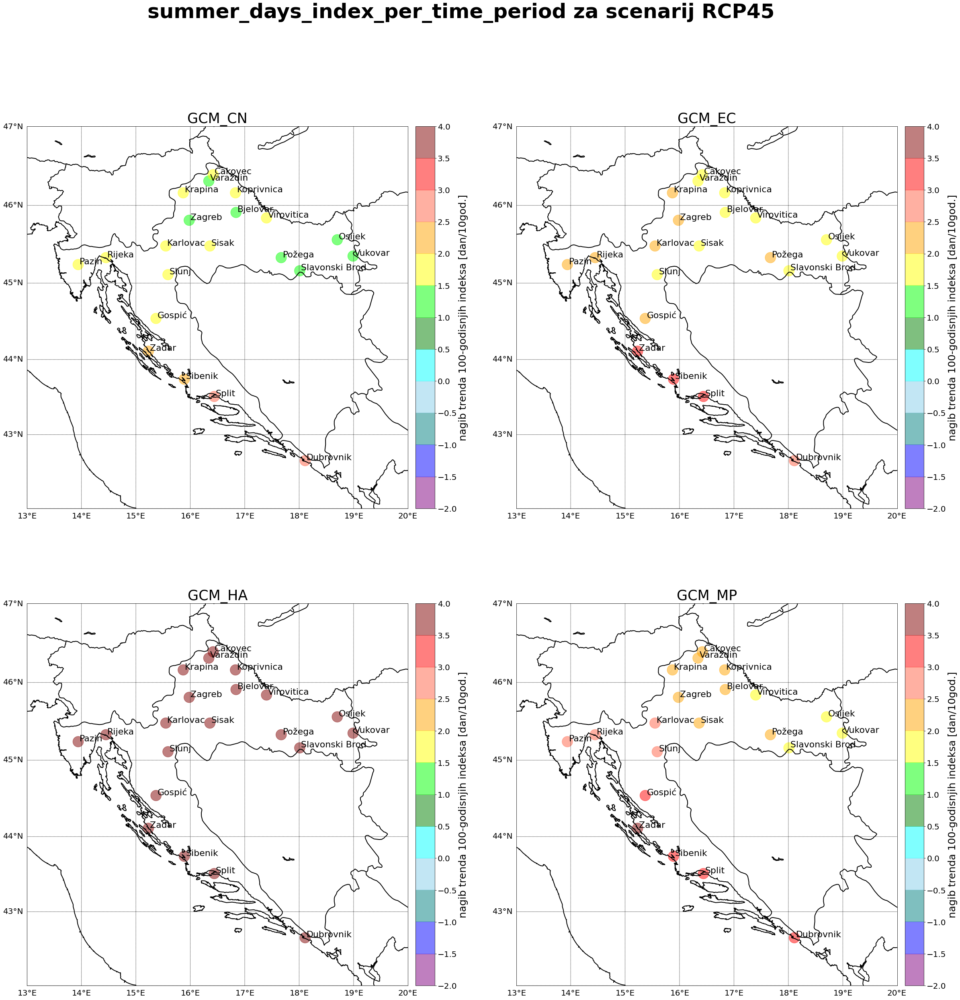

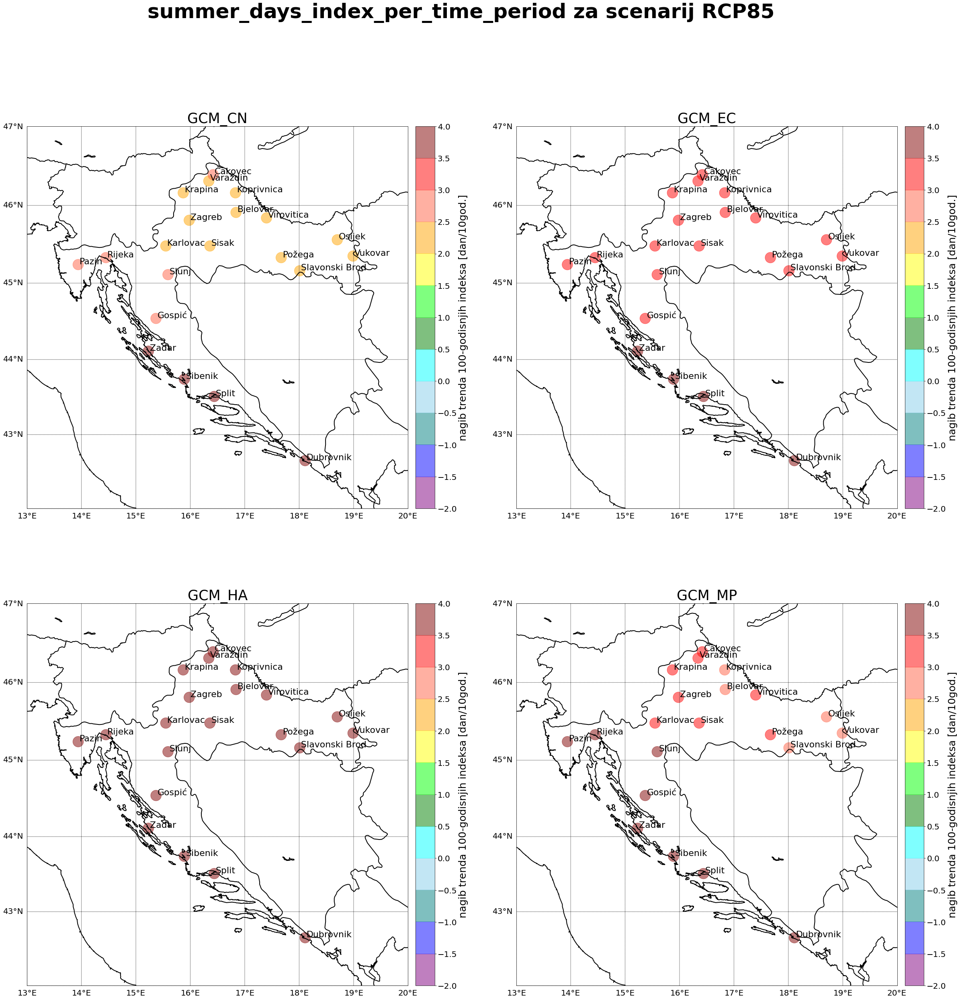

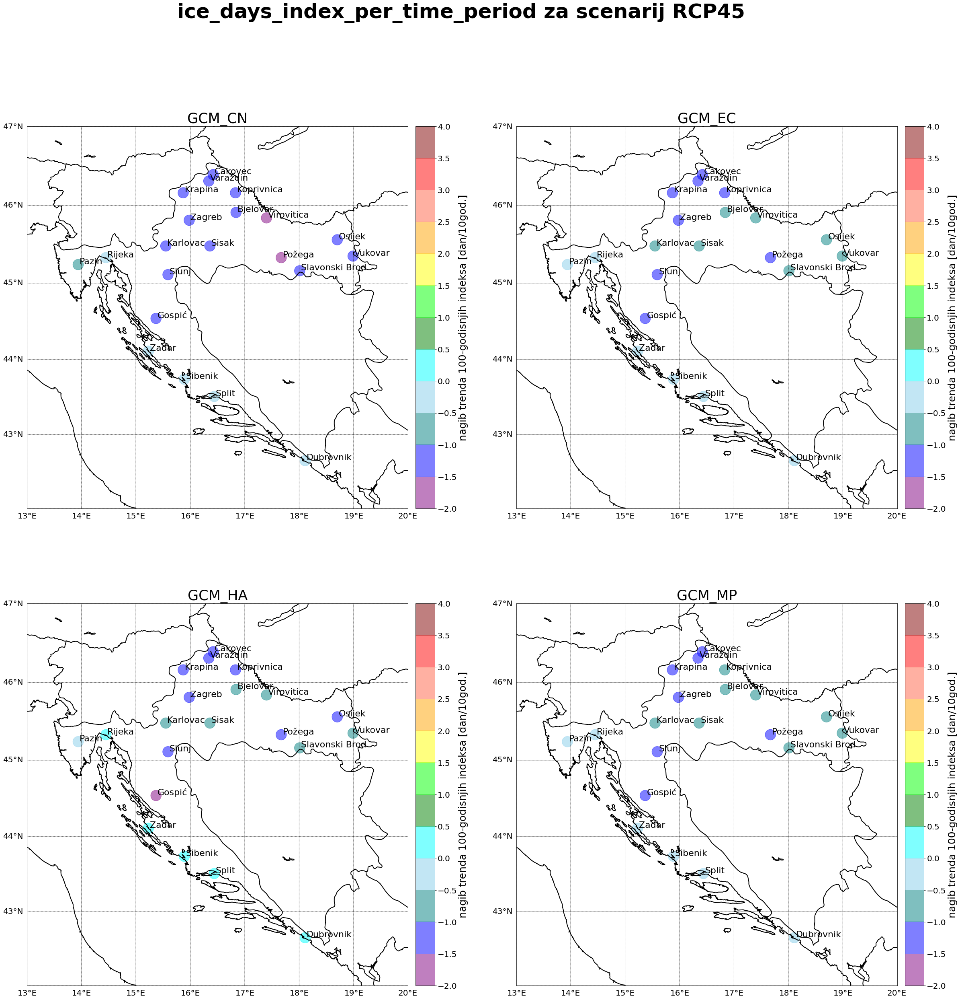

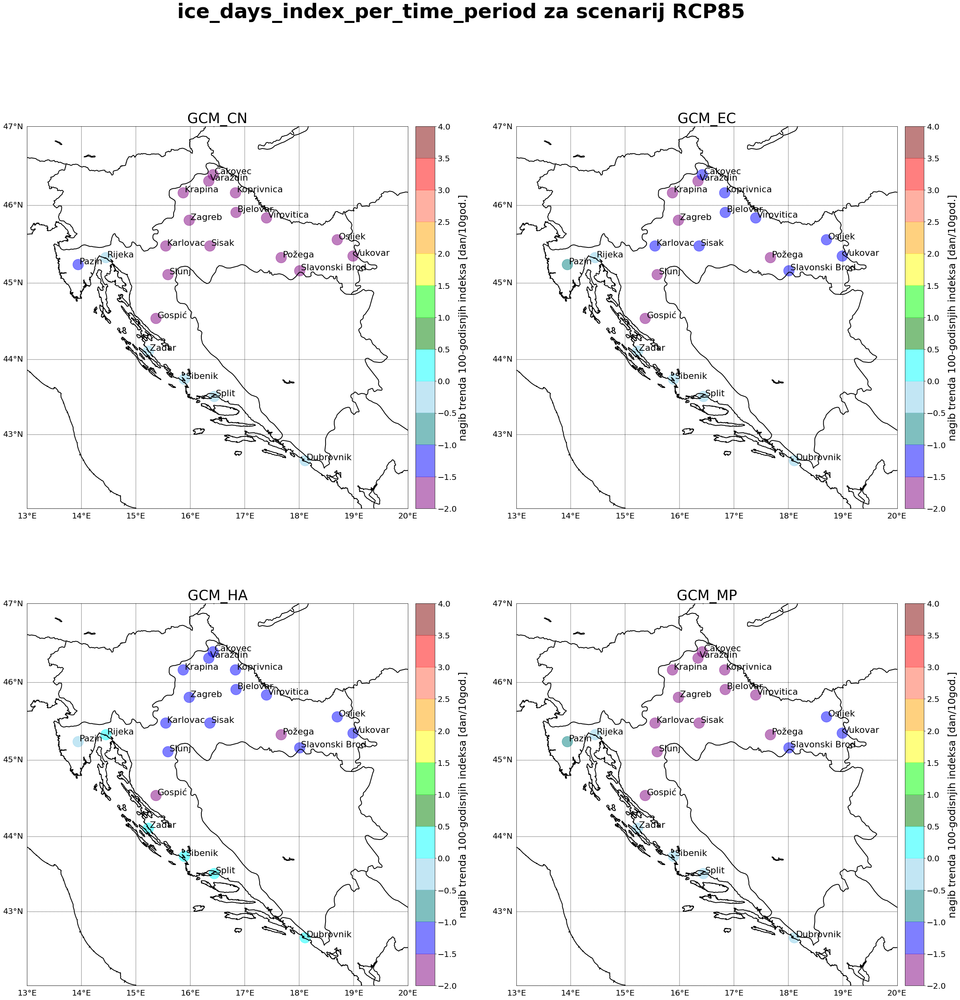

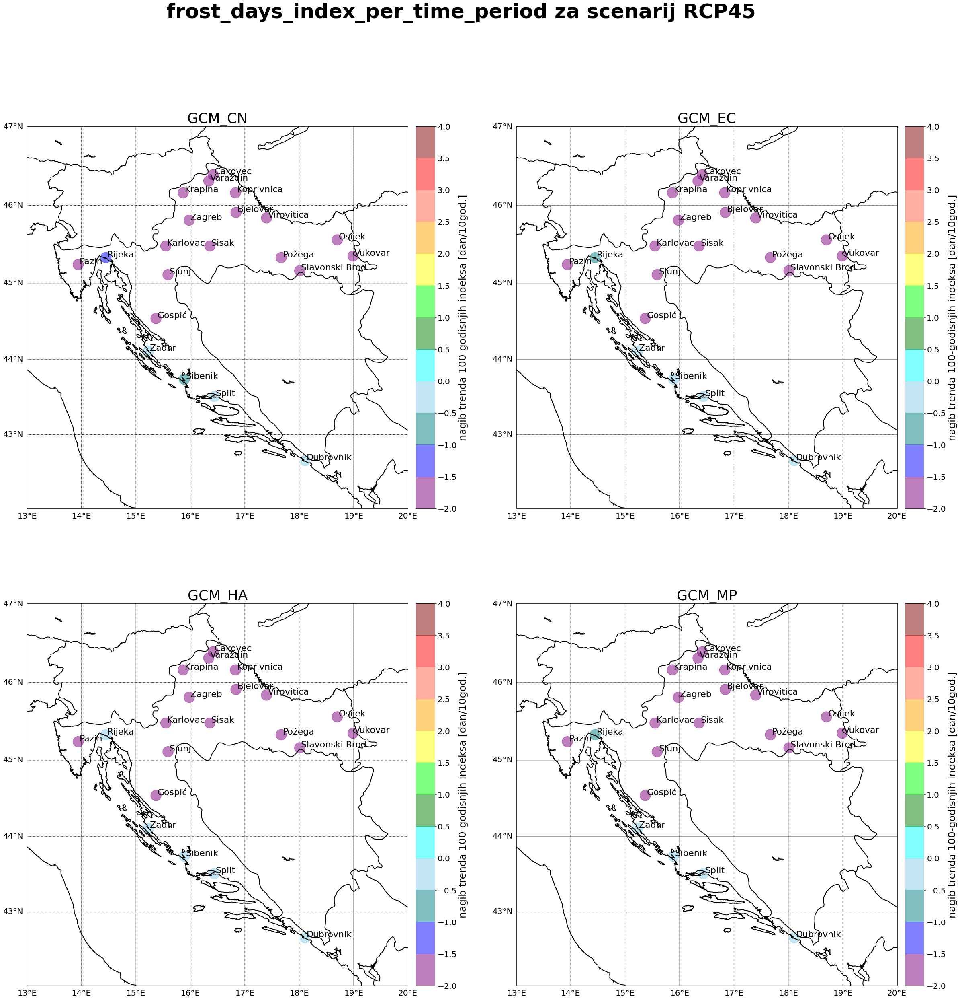

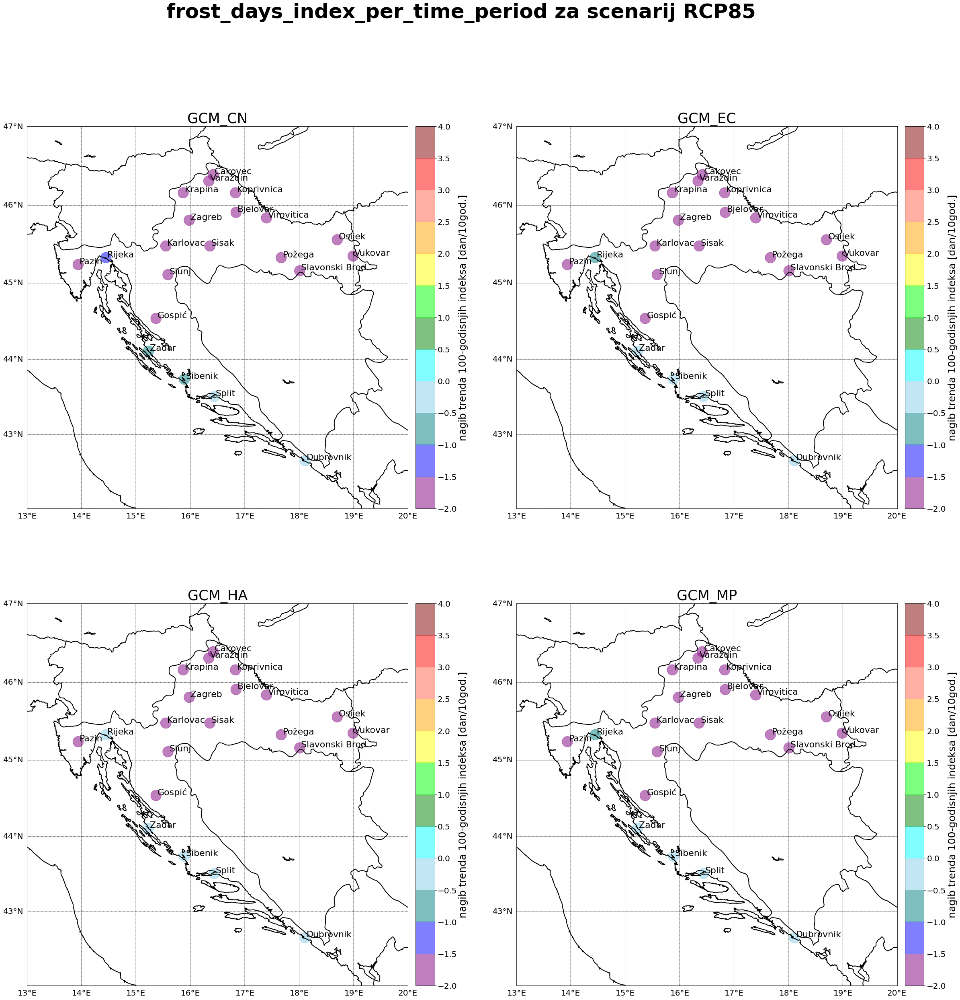

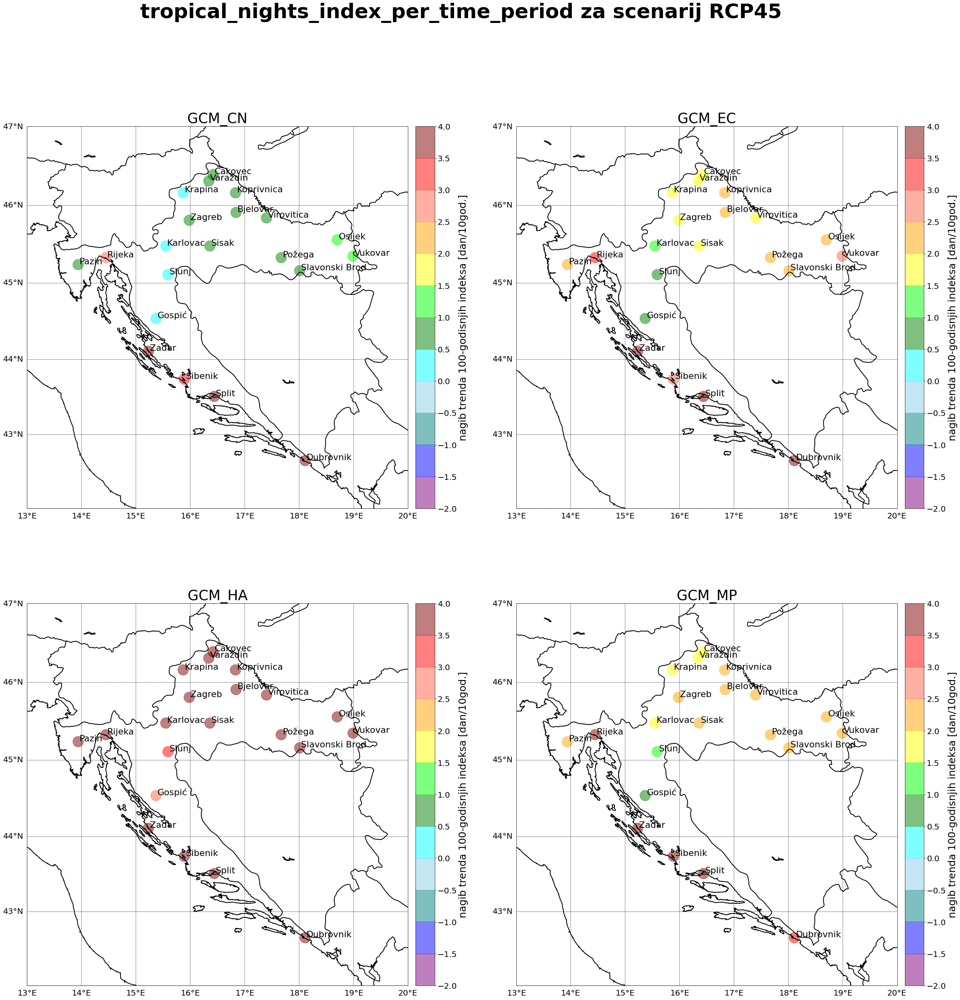

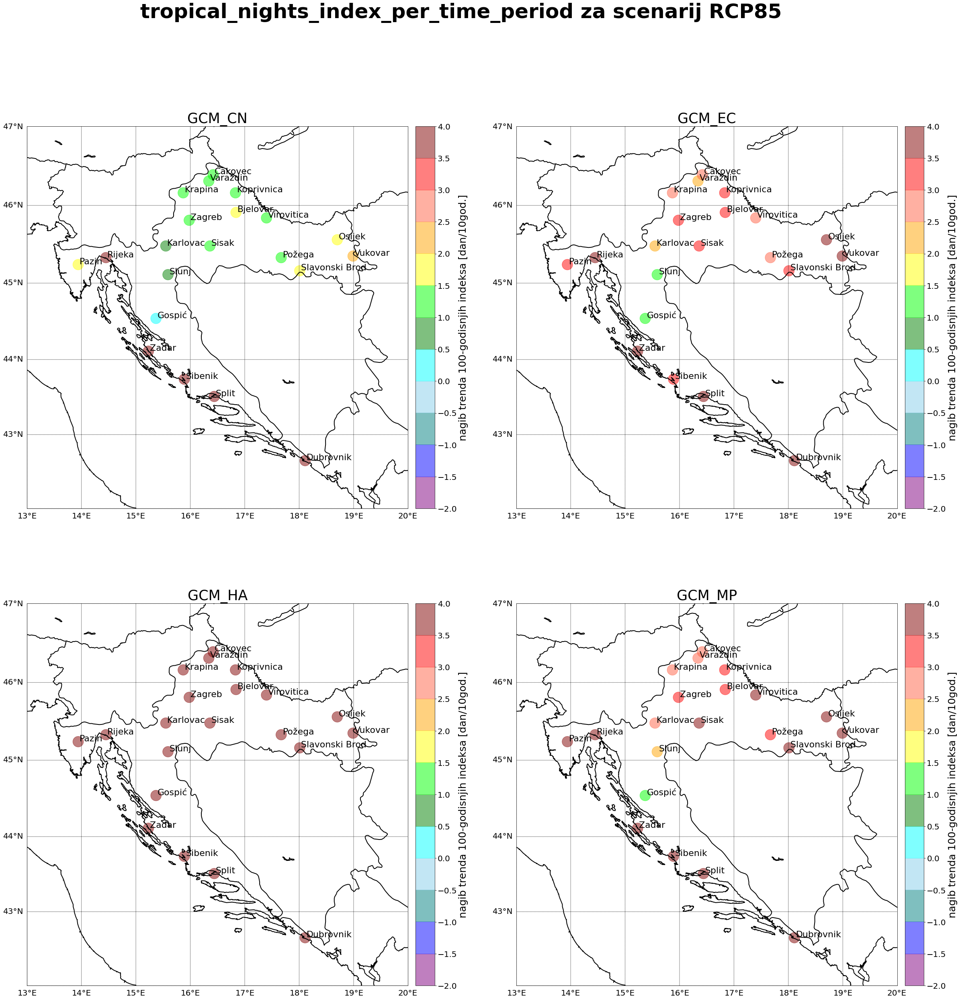

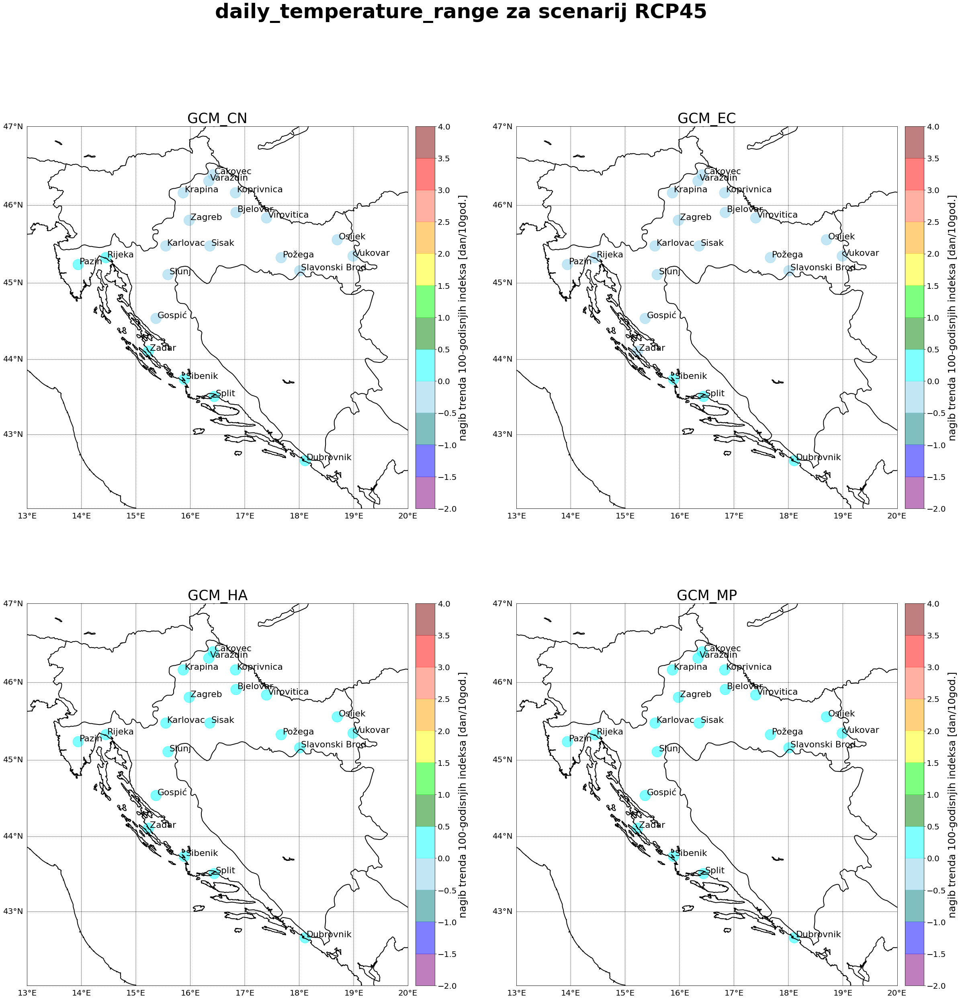

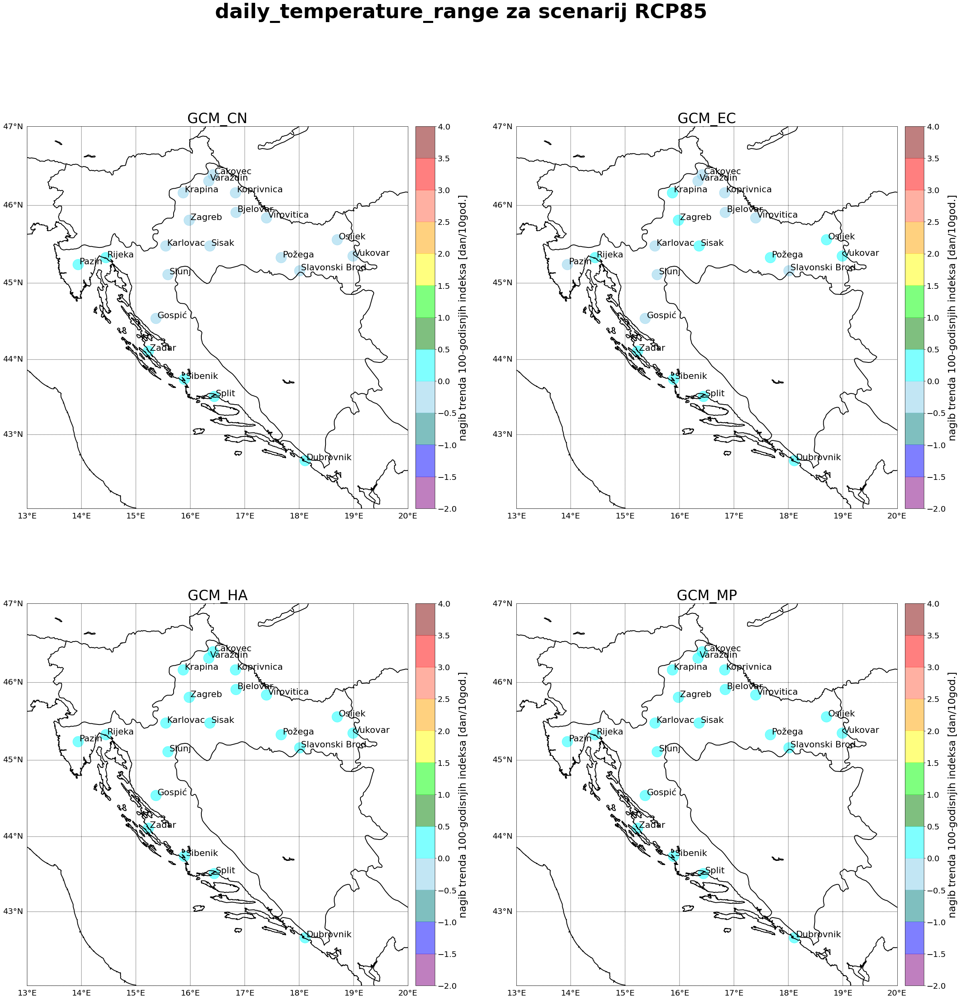

In [1]:
#crtanje indeksa na karti hrvatske


#kod za čitanje Netcdf=Network common data form
from netCDF4 import Dataset
import numpy as np
import numpy.ma as ma # MaskedArray
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy.linalg as LA

# crtanje klimatoloskih indeksa
# za svaki scenarij i za svaku lokaciju i za svaki GCM model zasebno

plt.close('all')

#Funkcije

def lin_reg(temp,godine):
    X = godine - godine.mean()
    y = temp - temp.mean()
    cxy=X.T.dot(y)
    cxx=X.T.dot(X)
    a=LA.solve(cxx,cxy)
    fit=X.dot(a)
    b = temp.mean()-a*godine.mean()
    #ep = pogreška, odstupanje fita od y 
    ep=y-fit
    # r2 = koeficijent korelacije
    r2 = 1
    #r2=1-np.var(ep)/np.var(y)
    return r2,a,b,fit


def Ucitavanje (GC,RC,ts,G,ind,inde):
    file = '{}_{}_{}_GRAD_{}_eca_{}.nc'.format(GC,RC,ts,G,ind)
    fi = Dataset(file, mode='r')
    t = (fi.variables[inde][:].T).tolist()
    tm = [i for i in range(0,101)]
    for i in range (0,101):
        tm[i] = t[0][0][0][i]
    npa = np.asarray(tm).reshape(101,1)
    return tm,npa


def Ucitavanje_DTR (GC,RC,G):
    file = '{}_{}_GRAD_{}_sub.nc'.format(GC,RC,G)
    fi = Dataset(file, mode='r')
    t = (fi.variables['tasmax'][:].T).tolist()
    tm = [i for i in range(0,101)]
    for i in range (0,101):
        tm[i] = t[0][0][0][i]
    npa = np.asarray(tm).reshape(101,1)
    return tm,npa

#zato jer je GCM_EC za 1 mjesec manji od ostalih (ukupno 1211 umjesto 1212 podataka)
#def Ucitavanje_DTREC (GC,RC,G):
#    file = '{}_{}_GRAD_{}_sub.nc'.format(GC,RC,G)
#    fi = Dataset(file, mode='r')
#    t = (fi.variables['tasmax'][:].T).tolist()
#    tm = [i for i in range(0,1211)]
#    for i in range (0,1211):
#        tm[i] = t[0][0][0][i]
#    npa = np.asarray(tm).reshape(1211,1)
#    return tm,npa


def Crtanje (afir,bfir,asec,bsec,tm45,tm85,title,b,inde):
    time = [i for i in range(1,102)];
    timenp = np.asarray(time).reshape(101,1)
    
    ax[b].plot(time,tm45,'g',label='RCP45, {0:0.2f}dana/10god'.format(afir[0,0]*10),linewidth=3)
    ax[b].plot(timenp,timenp * afir + bfir,'g',linewidth=3)
    #ax[b].text(time[100]+1,timenp[97] * afir + bfir-0.3,'{0:0.2f}dan/10god'.format(afir[0,0]*10),fontsize=30,color='g')
    
    ax[b].plot(time,tm85,'r',label='RCP85, {0:0.2f}dana/10god'.format(asec[0,0]*10) ,linewidth=3)
    ax[b].plot(timenp,timenp * asec + bsec,'r',linewidth=3)
    #ax[b].text(time[100]+1,timenp[97] * asec + bsec+0.3,'{0:0.2f}dan/10god'.format(asec[0,0]*10),fontsize=30,color='r')
    
    xTicks = np.arange(1,102,20)
    xTickLabels = np.arange(1970,2071,20)
    
    ax[b].grid(linestyle='-', linewidth='1', color='k');
    ax[b].set_title(title,fontsize=35)
    ax[b].set_xlabel('Godine',fontsize=25)
    ax[b].set_ylabel('{}'.format(inde),fontsize=25)
    ax[b].set_xticks(xTicks)
    ax[b].set_xticklabels(xTickLabels,fontsize = 25)
    ax[b].tick_params(axis='y', labelsize=20)
    handles, labels = ax[b].get_legend_handles_labels()
    ax[b].legend(handles[::-1], labels[::-1])
    ax[b].legend(prop=dict(size=20))
    
    
def Crtanje_DTR (afir,bfir,asec,bsec,tm45,tm85,title,b,inde):
    time = [i for i in range(1,102)];
    timenp = np.asarray(time).reshape(101,1)
    
    ax[b].plot(time,tm45,'g',label='RCP45, {0:0.2f}°C/10god'.format(afir[0,0]*10) ,linewidth=3)
    ax[b].plot(timenp,timenp * afir + bfir,'g',linewidth=3)
    #ax[b].text(time[1210]+1,timenp[1200] * afir + bfir-0.3,'{0:0.2f}°C/10god'.format(afir[0,0]*10),fontsize=30,color='g')
    
    ax[b].plot(time,tm85,'r',label='RCP85 {0:0.2f}°C/10god'.format(asec[0,0]*10) ,linewidth=3)
    ax[b].plot(timenp,timenp * asec + bsec,'r',linewidth=3)
    #ax[b].text(time[1210]+1,timenp[1200] * asec + bsec+0.3,'{0:0.2f}°C/10god'.format(asec[0,0]*10),fontsize=30,color='r')
    
    xTicks = np.arange(1,102,20)
    xTickLabels = np.arange(1970,2071,20)
        
        
    ax[b].grid(linestyle='-', linewidth='1', color='k');
    ax[b].set_title(title,fontsize=35)
    ax[b].set_xlabel('Godine',fontsize=25)
    ax[b].set_ylabel('{}'.format(inde),fontsize=25)
    ax[b].set_xticks(xTicks)
    ax[b].set_xticklabels(xTickLabels,fontsize = 25)
    ax[b].tick_params(axis='y', labelsize=20)
    handles, labels = ax[b].get_legend_handles_labels()
    ax[b].legend(handles[::-1], labels[::-1])
    ax[b].legend(prop=dict(size=20))
    

#def Crtanje_DTREC (afir,bfir,asec,bsec,tm45,tm85,title,b,inde):
#    time = [i for i in range(1,1212)];
#    timenp = np.asarray(time).reshape(1211,1)
#    
#    ax[b].plot(time,tm45,'g',label='RCP45, {0:0.2f}°C/10god'.format(afir[0,0]*10) ,linewidth=3)
#    ax[b].plot(timenp,timenp * afir + bfir,'g',linewidth=3)
#    #ax[b].text(time[1210]+1,timenp[1200] * afir + bfir-0.3,'{0:0.2f}°C/10god'.format(afir[0,0]*10),fontsize=30,color='g')
#    
#    ax[b].plot(time,tm85,'r',label='RCP85 {0:0.2f}°C/10god'.format(asec[0,0]*10) ,linewidth=3)
#    ax[b].plot(timenp,timenp * asec + bsec,'r',linewidth=3)
#    #ax[b].text(time[1210]+1,timenp[1200] * asec + bsec+0.3,'{0:0.2f}°C/10god'.format(asec[0,0]*10),fontsize=30,color='r')
#    
#    xTicks = np.arange(1,1212,120)
#    xTickLabels = np.arange(1970,2071,10)
#        
#        
#    ax[b].grid(linestyle='-', linewidth='1', color='k');
#    ax[b].set_title(title,fontsize=35)
#    ax[b].set_xlabel('Godine',fontsize=25)
#    ax[b].set_ylabel('{}'.format(inde),fontsize=25)
#    ax[b].set_xticks(xTicks)
#    ax[b].set_xticklabels(xTickLabels,fontsize = 25)
#    ax[b].tick_params(axis='y', labelsize=20)
#    handles, labels = ax[b].get_legend_handles_labels()
#    ax[b].legend(handles[::-1], labels[::-1])
#    ax[b].legend(prop=dict(size=20))
    

    


Gr=[i for i in range(0,22)]
Gr[1]='Zagreb'; #
Gr[2]='Krapina'; 
Gr[3]='Sisak'; #
Gr[4]='Karlovac';
Gr[5]='Varaždin'; #
Gr[6]='Koprivnica';
Gr[7]='Bjelovar';
Gr[8]='Rijeka'; #
Gr[9]='Gospić'; #
Gr[10]='Virovitica';
Gr[11]='Požega';
Gr[12]='Slavonski Brod'; #
Gr[13]='Zadar'; #
Gr[14]='Osijek'; #
Gr[15]='Šibenik';
Gr[16]='Vukovar';
Gr[17]='Split'; #
Gr[18]='Pazin'; #
Gr[19]='Dubrovnik'; #
Gr[20]='Čakovec';
Gr[21]='Slunj';


GCM = ['CN', 'EC', 'HA', 'MP']
tas = ['tasmax','tasmin']
RCP = ['RCP45', 'RCP85']
Grad = ['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21']
INDEX=['su','id','fd','tr']
index = ['summer_days','ice_days','frost_days','tropical_nights']
indexx = ['summer_days_index_per_time_period','ice_days_index_per_time_period','frost_days_index_per_time_period','tropical_nights_index_per_time_period']
time = [i for i in range(1,102)]
timenp = np.asarray(time).reshape(101,1)

#pospremanje nagiba indeksa
#*4 zbog 4 GCM modela, 21 grada

#RCP45
su45 = [i for i in range(0,21*4)]
id45 = [i for i in range(0,21*4)]
fd45 = [i for i in range(0,21*4)]
tr45 = [i for i in range(0,21*4)]
dtr45 = [i for i in range(0,21*4)]
#RCP85
su85 = [i for i in range(0,21*4)]
id85 = [i for i in range(0,21*4)]
fd85 = [i for i in range(0,21*4)]
tr85 = [i for i in range(0,21*4)]
dtr85 = [i for i in range(0,21*4)]

##########################################################################################################################################################
#indeksi vezani za tasmax
a = 1 #brojac
b = 0 #brojac
for G in Grad:
    
    CN451,CN45np1 = Ucitavanje(GCM[0],RCP[0],tas[0],G,INDEX[0],indexx[0])
    r2, a1, b1, fit1 = lin_reg(CN45np1,timenp)
    su45[b] = round(a1[0,0]*10,2)
    CN851,CN85np1 = Ucitavanje(GCM[0],RCP[1],tas[0],G,INDEX[0],indexx[0])
    r2, a2, b2, fit2 = lin_reg(CN85np1,timenp)
    su85[b] = round(a2[0,0]*10,2)
    
    CN452,CN45np2 = Ucitavanje(GCM[0],RCP[0],tas[0],G,INDEX[1],indexx[1])
    r2, a3, b3, fit3 = lin_reg(CN45np2,timenp)
    id45[b] = round(a3[0,0]*10,2)
    CN852,CN85np2 = Ucitavanje(GCM[0],RCP[1],tas[0],G,INDEX[1],indexx[1])
    r2, a4, b4, fit4 = lin_reg(CN85np2,timenp)
    id85[b] = round(a4[0,0]*10,2)
    
    CN451m,CN45np1m = Ucitavanje(GCM[0],RCP[0],tas[1],G,INDEX[2],indexx[2])
    r2, a1m, b1m, fit1 = lin_reg(CN45np1m,timenp)
    fd45[b] = round(a1m[0,0]*10,2)
    CN851m,CN85np1m = Ucitavanje(GCM[0],RCP[1],tas[1],G,INDEX[2],indexx[2])
    r2, a2m, b2m, fit2 = lin_reg(CN85np1m,timenp)
    fd85[b] = round(a2m[0,0]*10,2)
    
    CN452m,CN45np2m = Ucitavanje(GCM[0],RCP[0],tas[1],G,INDEX[3],indexx[3])
    r2, a3m, b3m, fit3 = lin_reg(CN45np2m,timenp)
    tr45[b] = round(a3m[0,0]*10,2)
    CN852m,CN85np2m = Ucitavanje(GCM[0],RCP[1],tas[1],G,INDEX[3],indexx[3])
    r2, a4m, b4m, fit4 = lin_reg(CN85np2m,timenp)
    tr85[b] = round(a4m[0,0]*10,2)
    
    CN451d,CN45np1d = Ucitavanje_DTR(GCM[0],RCP[0],G)
    r2, a1d, b1d, fit1 = lin_reg(CN45np1d,timenp)
    dtr45[b] = round(a1d[0,0]*10,2)
    CN851d,CN85np1d = Ucitavanje_DTR(GCM[0],RCP[1],G)
    r2, a2d, b2d, fit2 = lin_reg(CN85np1d,timenp)
    dtr85[b] = round(a2d[0,0]*10,2)
    
    
    
    
    
    EC451,EC45np1 = Ucitavanje(GCM[1],RCP[0],tas[0],G,INDEX[0],indexx[0])
    r2, a5, b5, fit5 = lin_reg(EC45np1,timenp)
    su45[b+21] = round(a5[0,0]*10,2)
    EC851,EC85np1 = Ucitavanje(GCM[1],RCP[1],tas[0],G,INDEX[0],indexx[0])
    r2, a6, b6, fit6 = lin_reg(EC85np1,timenp)
    su85[b+21] = round(a6[0,0]*10,2)
    
    EC452,EC45np2 = Ucitavanje(GCM[1],RCP[0],tas[0],G,INDEX[1],indexx[1])
    r2, a7, b7, fit7 = lin_reg(EC45np2,timenp)
    id45[b+21] = round(a7[0,0]*10,2)    
    EC852,EC85np2 = Ucitavanje(GCM[1],RCP[1],tas[0],G,INDEX[1],indexx[1])
    r2, a8, b8, fit8 = lin_reg(EC85np2,timenp)
    id85[b+21] = round(a8[0,0]*10,2)     
    
    EC451m,EC45np1m = Ucitavanje(GCM[1],RCP[0],tas[1],G,INDEX[2],indexx[2])
    r2, a5m, b5m, fit5 = lin_reg(EC45np1m,timenp)
    fd45[b+21] = round(a5m[0,0]*10,2)
    EC851m,EC85np1m = Ucitavanje(GCM[1],RCP[1],tas[1],G,INDEX[2],indexx[2])
    r2, a6m, b6m, fit6 = lin_reg(EC85np1m,timenp)
    fd85[b+21] = round(a6m[0,0]*10,2)
    
    EC452m,EC45np2m = Ucitavanje(GCM[1],RCP[0],tas[1],G,INDEX[3],indexx[3])
    r2, a7m, b7m, fit7 = lin_reg(EC45np2m,timenp)
    tr45[b+21] = round(a7m[0,0]*10,2)
    EC852m,EC85np2m = Ucitavanje(GCM[1],RCP[1],tas[1],G,INDEX[3],indexx[3])
    r2, a8m, b8m, fit8 = lin_reg(EC85np2m,timenp)
    tr85[b+21] = round(a8m[0,0]*10,2)
    
    EC451d,EC45np1d = Ucitavanje_DTR(GCM[1],RCP[0],G)
    r2, a5d, b5d, fit5 = lin_reg(EC45np1d,timenp)
    dtr45[b+21] = round(a5d[0,0]*10,2)
    EC851d,EC85np1d = Ucitavanje_DTR(GCM[1],RCP[1],G)
    r2, a6d, b6d, fit6 = lin_reg(EC85np1d,timenp)
    dtr85[b+21] = round(a6d[0,0]*10,2)
    
    
    
    
    HA451,HA45np1 = Ucitavanje(GCM[2],RCP[0],tas[0],G,INDEX[0],indexx[0])
    r2, a9, b9, fit9 = lin_reg(HA45np1,timenp)
    su45[b+21*2] = round(a9[0,0]*10,2)    
    HA851,HA85np1 = Ucitavanje(GCM[2],RCP[1],tas[0],G,INDEX[0],indexx[0])
    r2, a10, b10, fit10 = lin_reg(HA85np1,timenp)
    su85[b+21*2] = round(a10[0,0]*10,2)    
    
    HA452,HA45np2 = Ucitavanje(GCM[2],RCP[0],tas[0],G,INDEX[1],indexx[1])
    r2, a11, b11, fit11 = lin_reg(HA45np2,timenp)
    id45[b+21*2] = round(a11[0,0]*10,2)  
    HA852,HA85np2 = Ucitavanje(GCM[2],RCP[1],tas[0],G,INDEX[1],indexx[1])
    r2, a12, b12, fit12 = lin_reg(HA85np2,timenp)
    id85[b+21*2] = round(a12[0,0]*10,2)      
    
    HA451m,HA45np1m = Ucitavanje(GCM[2],RCP[0],tas[1],G,INDEX[2],indexx[2])
    r2, a9m, b9m, fit9 = lin_reg(HA45np1m,timenp)
    fd45[b+21*2] = round(a9m[0,0]*10,2)    
    HA851m,HA85np1m = Ucitavanje(GCM[2],RCP[1],tas[1],G,INDEX[2],indexx[2])
    r2, a10m, b10m, fit10 = lin_reg(HA85np1m,timenp)
    fd85[b+21*2] = round(a10m[0,0]*10,2)    
    
    HA452m,HA45np2m = Ucitavanje(GCM[2],RCP[0],tas[1],G,INDEX[3],indexx[3])
    r2, a11m, b11m, fit11 = lin_reg(HA45np2m,timenp)
    tr45[b+21*2] = round(a11m[0,0]*10,2)    
    HA852m,HA85np2m = Ucitavanje(GCM[2],RCP[1],tas[1],G,INDEX[3],indexx[3])
    r2, a12m, b12m, fit12 = lin_reg(HA85np2m,timenp)
    tr85[b+21*2] = round(a12m[0,0]*10,2)    
    
    HA451d,HA45np1d = Ucitavanje_DTR(GCM[2],RCP[0],G)
    r2, a9d, b9d, fit9 = lin_reg(HA45np1d,timenp)
    dtr45[b+21*2] = round(a9d[0,0]*10,2)    
    HA851d,HA85np1d = Ucitavanje_DTR(GCM[2],RCP[1],G)
    r2, a10d, b10d, fit10 = lin_reg(HA85np1d,timenp)
    dtr85[b+21*2] = round(a10d[0,0]*10,2)    
    
    
    
    
    MP451,MP45np1 = Ucitavanje(GCM[3],RCP[0],tas[0],G,INDEX[0],indexx[0])
    r2, a13, b13, fit13 = lin_reg(MP45np1,timenp)
    su45[b+21*3] = round(a13[0,0]*10,2)      
    MP851,MP85np1 = Ucitavanje(GCM[3],RCP[1],tas[0],G,INDEX[0],indexx[0])
    r2, a14, b14, fit14 = lin_reg(MP85np1,timenp)
    su85[b+21*3] = round(a14[0,0]*10,2)     
    
    MP452,MP45np2 = Ucitavanje(GCM[3],RCP[0],tas[0],G,INDEX[1],indexx[1])
    r2, a15, b15, fit15 = lin_reg(MP45np2,timenp)
    id45[b+21*3] = round(a15[0,0]*10,2)    
    MP852,MP85np2 = Ucitavanje(GCM[3],RCP[1],tas[0],G,INDEX[1],indexx[1])
    r2, a16, b16, fit16 = lin_reg(MP85np2,timenp)
    id85[b+21*3] = round(a16[0,0]*10,2)    
    
    MP451m,MP45np1m = Ucitavanje(GCM[3],RCP[0],tas[1],G,INDEX[2],indexx[2])
    r2, a13m, b13m, fit13 = lin_reg(MP45np1m,timenp)
    fd45[b+21*3] = round(a13m[0,0]*10,2)     
    MP851m,MP85np1m = Ucitavanje(GCM[3],RCP[1],tas[1],G,INDEX[2],indexx[2])
    r2, a14m, b14m, fit14 = lin_reg(MP85np1m,timenp)
    fd85[b+21*3] = round(a14m[0,0]*10,2)     
    
    MP452m,MP45np2m = Ucitavanje(GCM[3],RCP[0],tas[1],G,INDEX[3],indexx[3])
    r2, a15m, b15m, fit15 = lin_reg(MP45np2m,timenp)
    tr45[b+21*3] = round(a15m[0,0]*10,2)      
    MP852m,MP85np2m = Ucitavanje(GCM[3],RCP[1],tas[1],G,INDEX[3],indexx[3])
    r2, a16m, b16m, fit16 = lin_reg(MP85np2m,timenp)
    tr85[b+21*3] = round(a16m[0,0]*10,2)      
    
    MP451d,MP45np1d = Ucitavanje_DTR(GCM[3],RCP[0],G)
    r2, a13d, b13d, fit13 = lin_reg(MP45np1d,timenp)
    dtr45[b+21*3] = round(a13d[0,0]*10,2)     
    MP851d,MP85np1d = Ucitavanje_DTR(GCM[3],RCP[1],G)
    r2, a14d, b14d, fit14 = lin_reg(MP85np1d,timenp)
    dtr85[b+21*3] = round(a14d[0,0]*10,2)    
    
    
    a += 1
    b += 1
    
    
#indeksi:

indeksi = [su45, su85, id45, id85, fd45, fd85, tr45, tr85, dtr45, dtr85]
    
LON=[i for i in range(0,21)]
LAT=[i for i in range(0,21)]

LON[0]=15.98; LAT[0]=45.81;   #Zagreb
LON[1]=15.87; LAT[1]=46.16;   #Krapina 
LON[2]=16.36; LAT[2]=45.48;   #Sisak 
LON[3]=15.55; LAT[3]=45.48;   #Karlovac 
LON[4]=16.34; LAT[4]=46.31;   #Varaždin 
LON[5]=16.83; LAT[5]=46.16;   #Koprivnica 
LON[6]=16.84; LAT[6]=45.91;   #Bjelovar
LON[7]=14.45; LAT[7]=45.33;   #Rijeka
LON[8]=15.37; LAT[8]=44.54;   #Gospić
LON[9]=17.40; LAT[9]=45.84;   #Virovitica
LON[10]=17.67; LAT[10]=45.33; #Požega
LON[11]=18.01; LAT[11]=45.16; #Slavonski Brod
LON[12]=15.23; LAT[12]=44.11; #Zadar
LON[13]=18.70; LAT[13]=45.56; #Osijek
LON[14]=15.89; LAT[14]=43.74; #Šibenik
LON[15]=18.99; LAT[15]=45.35; #Vukovar
LON[16]=16.44; LAT[16]=43.51; #Split
LON[17]=13.94; LAT[17]=45.24; #Pazin
LON[18]=18.11; LAT[18]=42.65; #Dubrovnik
LON[19]=16.42; LAT[19]=46.39; #Čakovec
LON[20]=15.59; LAT[20]=45.11; #Slunj


#crtamo kartu Hrvatske (samo granice zemalja) 
from netCDF4 import Dataset
import numpy as np
import numpy.ma as ma # MaskedArray
import matplotlib.pyplot as plt
import os
os.environ['PROJ_LIB'] = '/Users/domag/anaconda3/Library/share/proj' #problem kod conde i path od pospremanja paketa
from mpl_toolkits.basemap import Basemap

b = 0 #brojac
s = 0 #brojac
index = ['summer_days_index_per_time_period','ice_days_index_per_time_period','frost_days_index_per_time_period','tropical_nights_index_per_time_period','daily_temperature_range']
RCP = ['RCP45', 'RCP85']

for ind in index:
    for R in RCP:
        
        fig = plt.figure(figsize=(40,40))
        fig.suptitle('{} za scenarij {}'.format(ind,R), fontsize=50, fontweight='bold')
        
        
        ax = fig.add_subplot(221)
        ax.set_title("GCM_CN",fontsize=35)
        map = Basemap(projection='merc',llcrnrlon=13.,llcrnrlat=42.,urcrnrlon=20.,urcrnrlat=47.,resolution='h')
        
        map.drawcoastlines(linewidth=2.0)
        map.drawcountries(linewidth=2.0) 
        
        xstep = 1
        ystep = 1
        parallels = np.round(np.arange(41,48,ystep),2) # make latitude lines od modela s pocetnim i konacnim 
        meridians = np.round(np.arange(13,21,xstep),2) # make longitude lines od modela s pocetnim i konacnim
    
        map.drawparallels(parallels,labels=[1,0,0,0],fontsize=20)
        map.drawmeridians(meridians,labels=[0,0,0,1],fontsize=20)
        
        trend = [i for i in range(0,21)]
        for i in range(0,21):
            trend[i] = indeksi[b][i]

        
        cmap = mpl.colors.ListedColormap(['purple','blue','teal','skyblue','aqua','green','lime','yellow','orange','tomato','red','maroon'])
        bounds = [-2, -1.5,-1,-0.5,0,0.5,1,1.5,2,2.5,3,3.5,4]
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        
        pc = map.scatter(LON, LAT, latlon=True, c = trend, s = 700, cmap=cmap, norm=norm, alpha=0.5)
        
        for i in range(0,21):
            xpt,ypt = map(LON[i],LAT[i])
            # convert back to lat/lon
            lonpt, latpt = map(xpt,ypt,inverse=True)
            plt.text(xpt+3000,ypt+1000,Gr[i+1],fontsize=22)        
        
        cbar = map.colorbar(pc, location='right', ticks = bounds)
        plt.clim(-2,4)
        cbar.set_label(label='nagib trenda 100-godisnjih indeksa [dan/10god.]', size = 25)
        cbar.ax.tick_params(labelsize=20)
        
        
        
        
        
        
        ax = fig.add_subplot(222)
        ax.set_title("GCM_EC",fontsize=35)
        map = Basemap(projection='merc',llcrnrlon=13.,llcrnrlat=42.,urcrnrlon=20.,urcrnrlat=47.,resolution='h')
        
        map.drawcoastlines(linewidth=2.0)
        map.drawcountries(linewidth=2.0) 
        
        xstep = 1
        ystep = 1
        parallels = np.round(np.arange(41,48,ystep),2) # make latitude lines od modela s pocetnim i konacnim 
        meridians = np.round(np.arange(13,21,xstep),2) # make longitude lines od modela s pocetnim i konacnim
    
        map.drawparallels(parallels,labels=[1,0,0,0],fontsize=20)
        map.drawmeridians(meridians,labels=[0,0,0,1],fontsize=20)
        
        trend = [i for i in range(0,21)]
        for i in range(0,21):
            trend[i] = indeksi[b][i + 21]
        
        cmap = mpl.colors.ListedColormap(['purple','blue','teal','skyblue','aqua','green','lime','yellow','orange','tomato','red','maroon'])
        bounds = [-2, -1.5,-1,-0.5,0,0.5,1,1.5,2,2.5,3,3.5,4]
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        
        pc = map.scatter(LON, LAT, latlon=True, c = trend, s = 700, cmap=cmap, norm=norm, alpha=0.5)
        
        for i in range(0,21):
            xpt,ypt = map(LON[i],LAT[i])
            # convert back to lat/lon
            lonpt, latpt = map(xpt,ypt,inverse=True)
            plt.text(xpt+3000,ypt+1000,Gr[i+1],fontsize=22)          
        
        cbar = map.colorbar(pc, location='right', ticks = bounds)
        plt.clim(-2,4)
        cbar.set_label(label='nagib trenda 100-godisnjih indeksa [dan/10god.]', size = 25)
        cbar.ax.tick_params(labelsize=20)
        
        
        
        
        
        
        ax = fig.add_subplot(223)
        ax.set_title("GCM_HA",fontsize=35)
        map = Basemap(projection='merc',llcrnrlon=13.,llcrnrlat=42.,urcrnrlon=20.,urcrnrlat=47.,resolution='h')
           
        map.drawcoastlines(linewidth=2.0)
        map.drawcountries(linewidth=2.0)     
            
        xstep = 1
        ystep = 1
        parallels = np.round(np.arange(41,48,ystep),2) # make latitude lines od modela s pocetnim i konacnim 
        meridians = np.round(np.arange(13,21,xstep),2) # make longitude lines od modela s pocetnim i konacnim
    
        map.drawparallels(parallels,labels=[1,0,0,0],fontsize=20)
        map.drawmeridians(meridians,labels=[0,0,0,1],fontsize=20)    
           
        trend = [i for i in range(0,21)]
        for i in range(0,21):
            trend[i] = indeksi[b][i + 21*2] 
        
        cmap = mpl.colors.ListedColormap(['purple','blue','teal','skyblue','aqua','green','lime','yellow','orange','tomato','red','maroon'])
        bounds = [ -2, -1.5,-1,-0.5,0,0.5,1,1.5,2,2.5,3,3.5,4]
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
        
        pc = map.scatter(LON, LAT, latlon=True, c = trend, s = 700, cmap=cmap, norm=norm, alpha=0.5)
        
        for i in range(0,21):
            xpt,ypt = map(LON[i],LAT[i])
            # convert back to lat/lon
            lonpt, latpt = map(xpt,ypt,inverse=True)
            plt.text(xpt+3000,ypt+1000,Gr[i+1],fontsize=22)          
        
        cbar = map.colorbar(pc, location='right', ticks = bounds)
        plt.clim(-2,4)
        cbar.set_label(label='nagib trenda 100-godisnjih indeksa [dan/10god.]', size = 25)
        cbar.ax.tick_params(labelsize=20)    
            
        
        
        
        
            
            
        ax = fig.add_subplot(224)
        ax.set_title("GCM_MP",fontsize=35)
        map = Basemap(projection='merc',llcrnrlon=13.,llcrnrlat=42.,urcrnrlon=20.,urcrnrlat=47.,resolution='h')
            
        map.drawcoastlines(linewidth=2.0)
        map.drawcountries(linewidth=2.0)     
            
        xstep = 1
        ystep = 1
        parallels = np.round(np.arange(41,48,ystep),2) # make latitude lines od modela s pocetnim i konacnim 
        meridians = np.round(np.arange(13,21,xstep),2) # make longitude lines od modela s pocetnim i konacnim
    
        map.drawparallels(parallels,labels=[1,0,0,0],fontsize=20)
        map.drawmeridians(meridians,labels=[0,0,0,1],fontsize=20)    
            
        trend = [i for i in range(0,21)]
        for i in range(0,21):
            trend[i] = indeksi[b][i + 21*3]
            
        cmap = mpl.colors.ListedColormap(['purple','blue','teal','skyblue','aqua','green','lime','yellow','orange','tomato','red','maroon'])
        norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
                       
        pc = map.scatter(LON, LAT, latlon=True, c = trend, s = 700, cmap=cmap, norm=norm, alpha=0.5)
        
        for i in range(0,21):
            xpt,ypt = map(LON[i],LAT[i])
            # convert back to lat/lon
            lonpt, latpt = map(xpt,ypt,inverse=True)
            plt.text(xpt+3000,ypt+1000,Gr[i+1],fontsize=22)          
        
        cbar = map.colorbar(pc, location='right', ticks = bounds)
        plt.clim(-2,4)
        cbar.set_label(label='nagib trenda 100-godisnjih indeksa [dan/10god.]', size = 25)
        cbar.ax.tick_params(labelsize=20)
        
        
            
        b += 1    
        
            
        plt.show() 
        fig.savefig('{} za scenarij {}.png'.format(ind,R))